In [2]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd
from scipy.io.wavfile import write

In [3]:
import librosa
speech_file = 'Signals/Speech/Sha`rawi.mp3'
speech_audio, speech_sample_rate = librosa.load(speech_file, sr=None)
speech_audio = speech_audio[3 * speech_sample_rate:]

In [4]:
def play_audio(audio_data, sample_rate=speech_sample_rate):
    normalized_audio = np.int16(audio_data / np.max(np.abs(audio_data)) * 32767)

    write("temp_audio.wav", sample_rate, normalized_audio)
    return ipd.Audio("temp_audio.wav")

def add_noise(audio_data, desired_snr=10):
    signal_power = np.mean(audio_data ** 2)
    noise_power = signal_power / (10 ** (desired_snr / 10))
    
    noise = np.random.normal(0, np.sqrt(noise_power), len(audio_data))
    return audio_data + noise

def plot_signal(signal, sr=speech_sample_rate):
    duration = len(signal) / sr
    time = np.linspace(0., duration, len(signal))
    plt.plot(time, signal)
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')
    plt.grid()
    plt.show()
    
def extract_period(audio_data, start_time, end_time, sample_rate=speech_sample_rate):
    start_sample = int(start_time * sample_rate)
    end_sample = int(end_time * sample_rate)
    return audio_data[start_sample:end_sample]

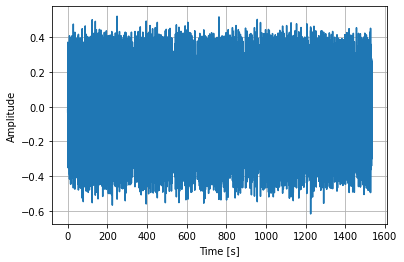

In [11]:
plot_signal(speech_audio)

In [5]:
regions = []
for i in range(10):
    start_time = 15 * i
    end_time = 15 * (i + 1)
    regions.append(extract_period(speech_audio, start_time, end_time))

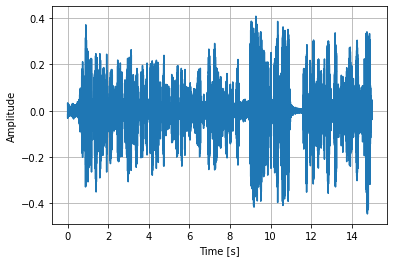

In [26]:
plot_signal(regions[0])
play_audio(regions[0])

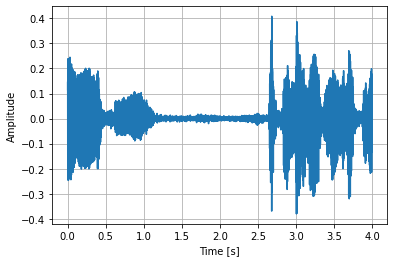

In [29]:
plot_signal(regions[1][5 * speech_sample_rate:9 * speech_sample_rate])
play_audio(regions[1][5 * speech_sample_rate:9 * speech_sample_rate])

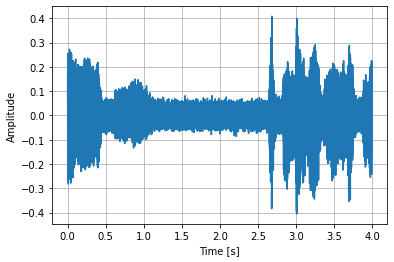

In [6]:
noisy_region_of_interest = add_noise(regions[1][5 * speech_sample_rate:9 * speech_sample_rate], desired_snr=10)
plot_signal(noisy_region_of_interest)
play_audio(noisy_region_of_interest)

In [7]:
def wiener_filter(noisy_signal, noise_start, noise_end, sample_rate=speech_sample_rate):
    noise_segment = noisy_signal[int(noise_start * sample_rate):int(noise_end * sample_rate)]
    
    # Step 2: Apply a window function to the noise segment
    window = np.hanning(len(noise_segment))
    windowed_noise = noise_segment * window
    
    # Step 4: Compute Fourier Transforms
    ft_noisy_signal = np.fft.fft(noisy_signal)
    ft_noise = np.fft.fft(windowed_noise, n=len(ft_noisy_signal))
    
    # Step 5: Compute Power Spectral Densities (PSDs)
    psd_noisy_signal = np.abs(ft_noisy_signal) ** 2
    psd_noise = np.abs(ft_noise) ** 2
    
    # Normalize the noise PSD and the noisy signal PSD to have a maximum of 100 each
    normalized_psd_noise = 100 * psd_noise / np.max(psd_noise)
    normalize_psd_noisy_signal = 100 * psd_noisy_signal / np.max(psd_noisy_signal)
    
    # plot the PSDs
    plt.figure(figsize=(12, 6))
    plt.plot(normalize_psd_noisy_signal[:len(psd_noisy_signal) // 2], label='Noisy Signal')
    plt.plot(normalized_psd_noise[:len(normalized_psd_noise) // 2], label='Noise')
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Power')
    plt.legend()
    plt.grid()
    plt.show()
    
    # Step 6: Compute the Wiener filter transfer function
    wiener_filter_transfer_function = 1 - normalized_psd_noise / normalize_psd_noisy_signal
    wiener_filter_transfer_function = np.maximum(wiener_filter_transfer_function, 0)  # Clamp to [0, 1]
    
    # Step 7: Apply the Wiener filter
    filtered_ft = ft_noisy_signal * wiener_filter_transfer_function
    
    # Step 8: Inverse Fourier Transform
    return np.fft.ifft(filtered_ft).real

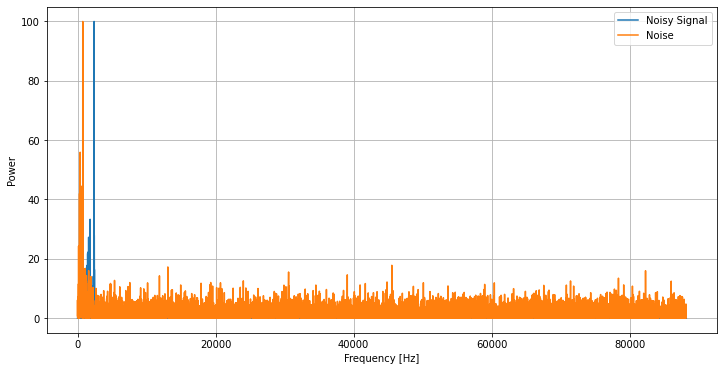

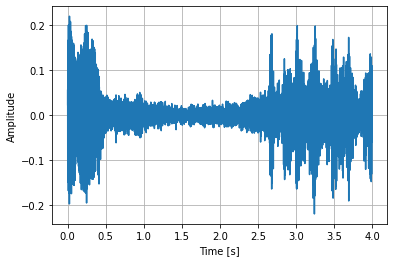

In [8]:
filtered_signal = wiener_filter(noisy_region_of_interest, 1, 2)
plot_signal(filtered_signal)
play_audio(filtered_signal)

Simple Tests

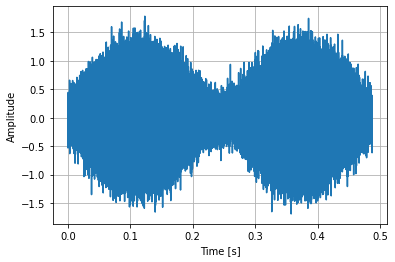

In [9]:
sine_wave = np.sin(2 * np.pi * 5 * np.linspace(0, 1000, 10_000))
blanks = np.zeros(1_500)
sine_wave = np.concatenate([sine_wave, blanks, sine_wave])
noisy_sine_wave = add_noise(sine_wave, desired_snr=10)
plot_signal(noisy_sine_wave)

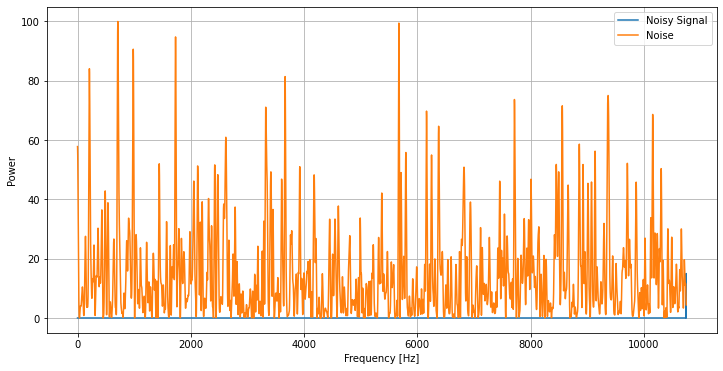

In [10]:
filtered_sin = wiener_filter(noisy_sine_wave, 10_000, 11_500, 1)
# plot_signal(filtered_sin)

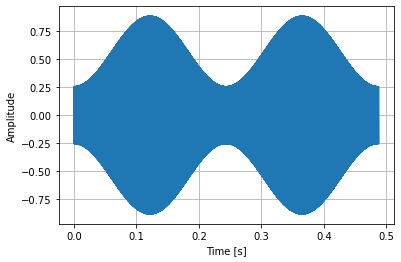

In [11]:
plot_signal(filtered_sin)

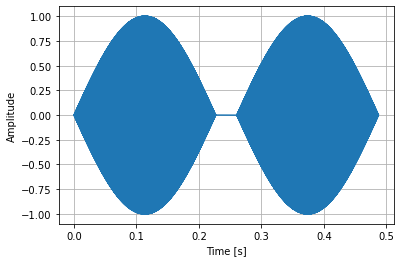

In [12]:
plot_signal(sine_wave)

WOW! Super interesting results!

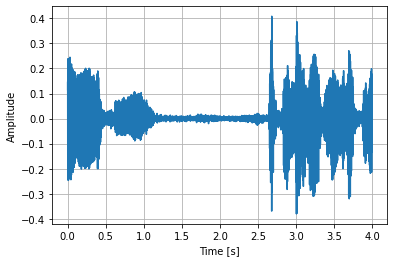

In [13]:
plot_signal(regions[1][5 * speech_sample_rate:9 * speech_sample_rate])
play_audio(regions[1][5 * speech_sample_rate:9 * speech_sample_rate])

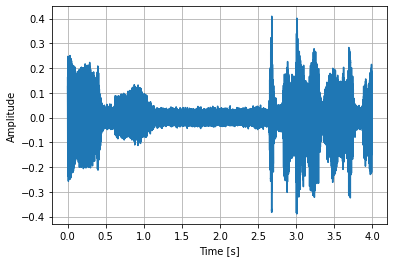

In [14]:
noisy_region_of_interest = add_noise(regions[1][5 * speech_sample_rate:9 * speech_sample_rate], desired_snr=15)
plot_signal(noisy_region_of_interest)
play_audio(noisy_region_of_interest)

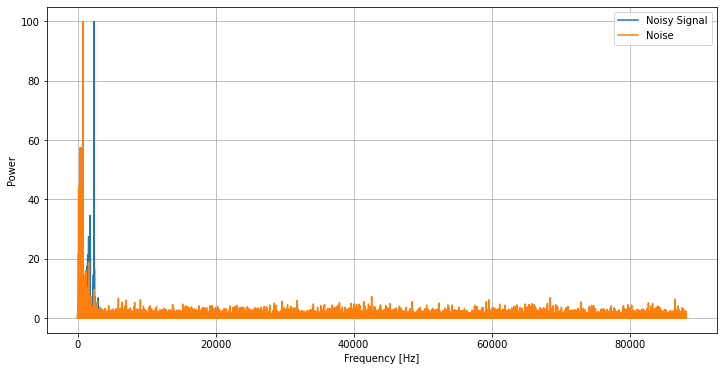

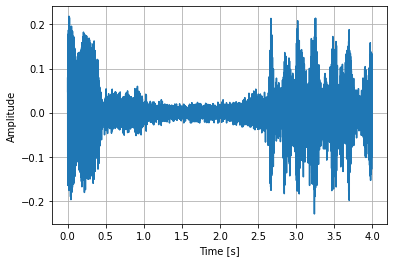

In [15]:
filtered_signal = wiener_filter(noisy_region_of_interest, 1, 2)
plot_signal(filtered_signal)
play_audio(filtered_signal)

In [6]:
def export_to_file(audio_data, file_name, sample_rate=speech_sample_rate):
    normalized_audio = np.int16(audio_data / np.max(np.abs(audio_data)) * 32767)
    write(file_name, sample_rate, normalized_audio)

In [151]:
play_audio(speech_audio)

In [7]:
region_of_interest = extract_period(speech_audio, 0, 30)
play_audio(region_of_interest)

In [8]:
noisy_region_of_interest = add_noise(region_of_interest, desired_snr=15)

In [9]:
export_to_file(noisy_region_of_interest, "Signals/Speech/Noisy Sha'rawi.wav")

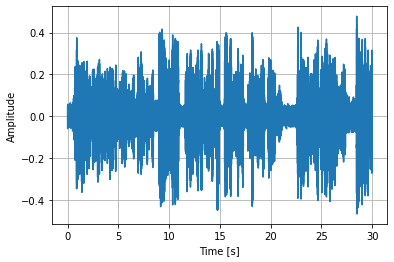

In [10]:
plot_signal(noisy_region_of_interest)

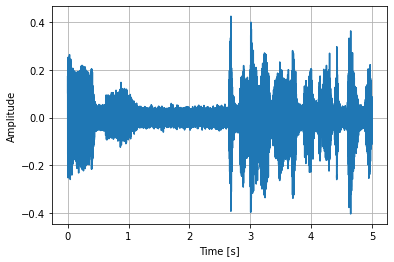

In [11]:
plot_signal(noisy_region_of_interest[20 * speech_sample_rate:25 * speech_sample_rate])

In [16]:
play_audio(noisy_region_of_interest)

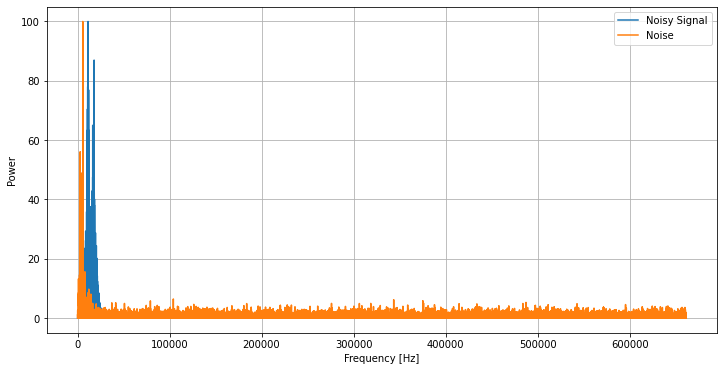

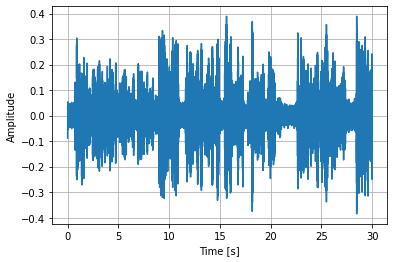

In [14]:
filtered_signal = wiener_filter(noisy_region_of_interest, 21, 22.5)
play_audio(filtered_signal)

In [15]:
play_audio(filtered_signal)